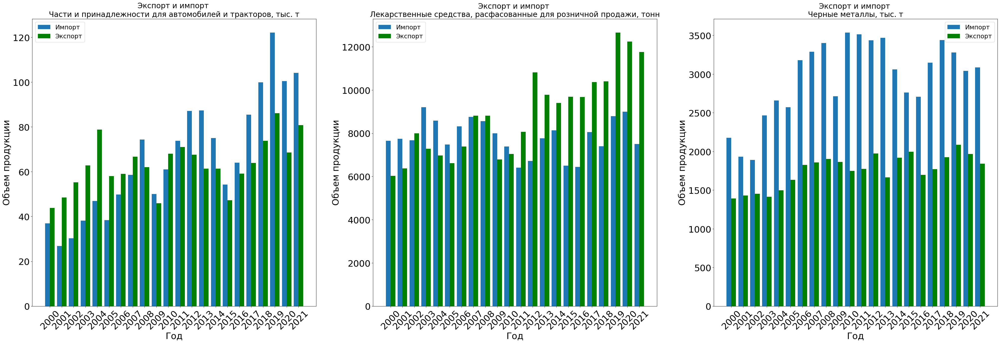

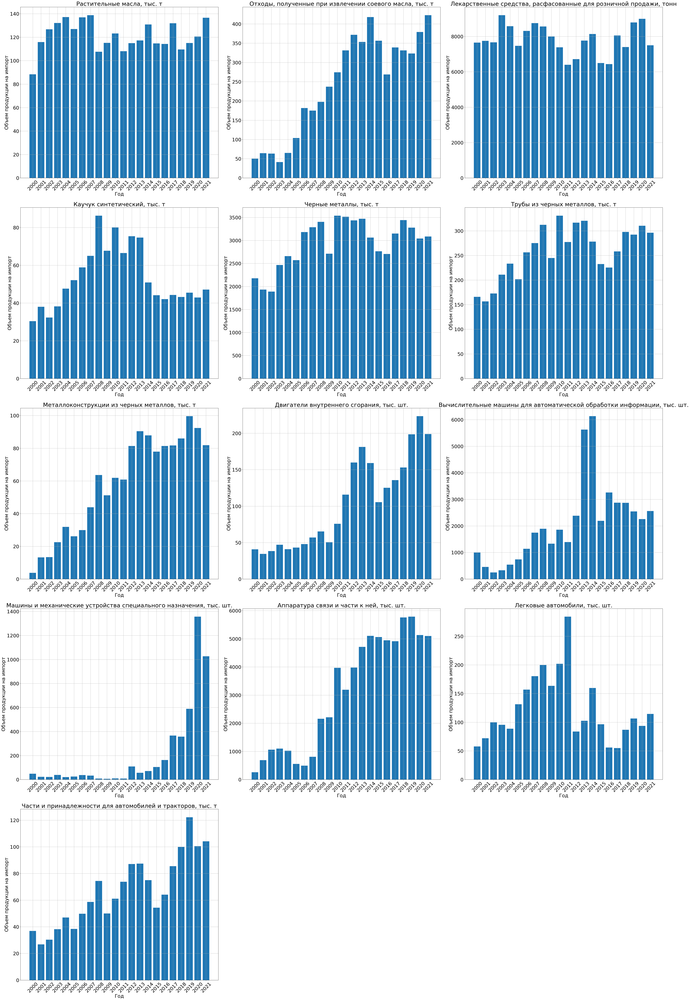

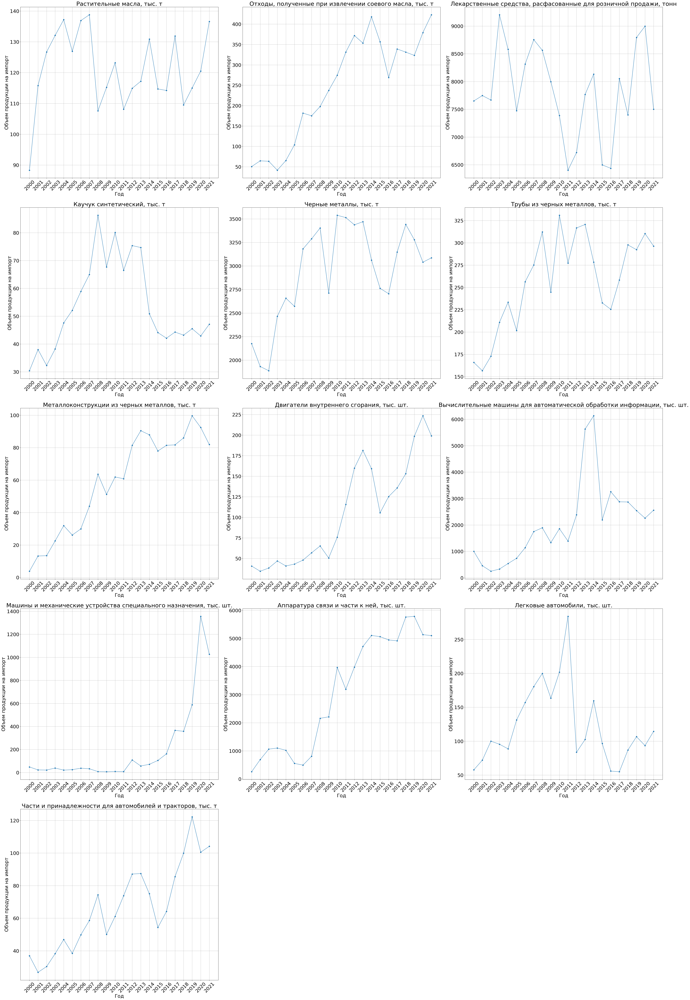

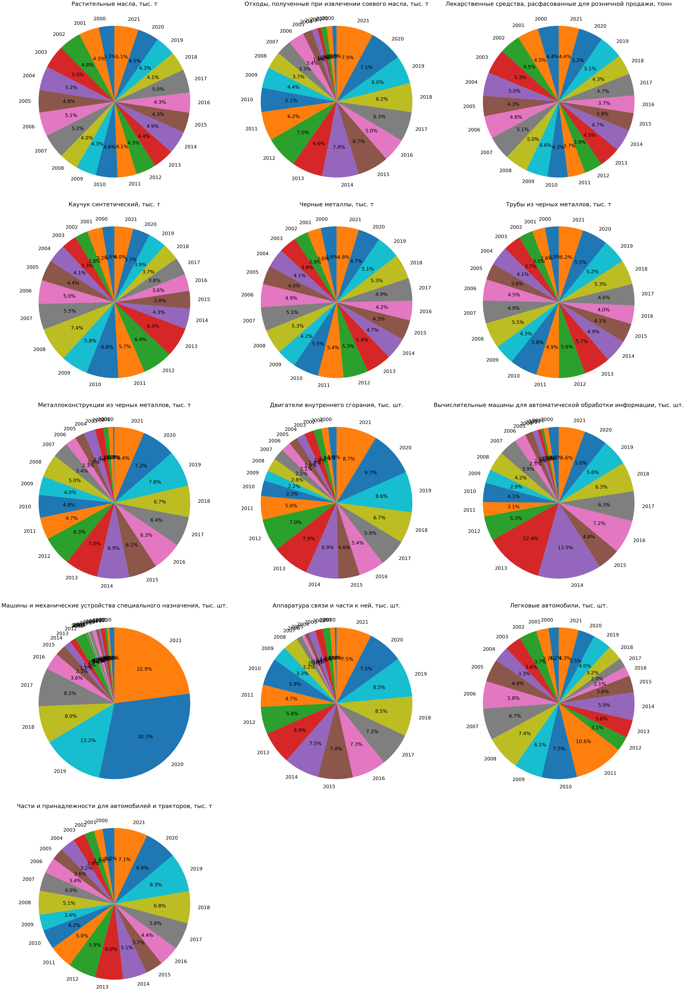

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import math
import numpy as np
df_export = pd.read_excel('export_tovarov_vazh-2021-1.xlsx')
df_import = pd.read_excel('import_tovarov_vazh-2021-1.xlsx')
def clean_df(df):
    df.dropna(inplace=True, how='all')
    df.reset_index(drop=True, inplace=True)
    new_header = df.iloc[0].copy()
    new_header.iloc[1:] = new_header.iloc[1:].astype('int64').astype(str)
    df = df[1:]
    df.columns = new_header
    df.columns.values[0]='Название продукции'
    df.reset_index(drop=True, inplace=True)
    for col in df.columns[1:]:
        df.loc[:, col] = pd.to_numeric(df[col].astype(str).str.replace('\xa0', '').str.replace(',', '.'))
    return df

def plot_create(df, plot_type, import_or_export):
    plt.rcParams.update({'font.size': 26})
    num_rows = len(df)
    num_cols = 3 
    num_plots = math.ceil(num_rows / num_cols)

    fig, axes = plt.subplots(num_plots, num_cols, figsize=(50, 15*num_plots))

    for idx, (index, row) in enumerate(df.iterrows()):
        row_idx = idx // num_cols
        col_idx = idx % num_cols
        ax = axes[row_idx, col_idx] if num_plots > 1 else axes[col_idx]

        if plot_type == 'bar':
            ax.bar(row.index[1:], row.values[1:])
        elif plot_type == 'line':
            ax.plot(row.index[1:], row.values[1:], marker='o')
        elif plot_type == 'pie':
            ax.pie(row.values[1:], labels=row.index[1:], autopct='%1.1f%%', startangle=90)
            ax.set_title(row['Название продукции'])
        if plot_type != 'pie':
            ax.set_title(row['Название продукции'])
            ax.set_xlabel('Год')
            ax.set_ylabel(f'Объем продукции на {import_or_export}')
            ax.grid(True)
            ax.tick_params(axis='x', rotation=45)

    for idx in range(num_rows, num_plots * num_cols):
        row_idx = idx // num_cols
        col_idx = idx % num_cols
        ax = axes[row_idx, col_idx] if num_plots > 1 else axes[col_idx]
        ax.axis('off')

    plt.tight_layout()
    plt.show()

clean_df_export = clean_df(df_export)
clean_df_import = clean_df(df_import)

common_names = set(clean_df_export['Название продукции']).intersection(set(clean_df_import['Название продукции']))
num_plot = 0   
num_rows = len(common_names)
num_cols = 3 
num_plots = math.ceil(num_rows / num_cols)

fig, axes = plt.subplots(num_plots, num_cols, figsize=(50, 15*num_plots))
for name in common_names:
    export_for_compare = clean_df_export[clean_df_export['Название продукции'] == name]
    import_for_compare = clean_df_import[clean_df_import['Название продукции'] == name]
    import_for_compare.reset_index(drop=True, inplace=True)
    export_for_compare.reset_index(drop=True, inplace=True)
    export_for_compare.set_index('Название продукции', inplace=True)
    export_for_compare = export_for_compare.transpose()
    import_for_compare.set_index('Название продукции', inplace=True)
    import_for_compare = import_for_compare.transpose()
    x = np.arange(len(import_for_compare.index))
    plt.rcParams.update({'font.size': 18})
    axes[num_plot].bar(x-0.2, import_for_compare[name], width=0.4, label='Импорт')
    axes[num_plot].bar(x+0.2, export_for_compare[name], width=0.4, label='Экспорт', color='green')
    axes[num_plot].set_title(f'Экспорт и импорт \n{name}')
    axes[num_plot].set_xlabel('Год')
    axes[num_plot].set_xticks(x, import_for_compare.index, rotation = 45)
    axes[num_plot].set_ylabel('Объем продукции')
    axes[num_plot].legend()
    num_plot+=1
plt.show()

plot_create(clean_df_export, 'bar', 'экспорт')
plot_create(clean_df_export, 'line', 'экспорт')
plot_create(clean_df_export, 'pie', 'экспорт')

plot_create(clean_df_import, 'bar', 'импорт')
plot_create(clean_df_import, 'line', 'импорт')
plot_create(clean_df_import, 'pie', 'импорт')
